In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.preprocessing import RobustScaler
import matplotlib.pyplot as plt
import plotly.express as px
import tensorflow as tf
from keras.models import Model, Sequential
from sklearn.metrics import classification_report, accuracy_score
from sklearn.manifold import TSNE
from keras.layers import Input, Dense
from keras import regularizers
from keras.models import Model, load_model
sns.set(style="whitegrid")
from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint, TensorBoard

Using TensorFlow backend.


Info over de data set<br/>
[data_set](https://www.kaggle.com/mlg-ulb/creditcardfraud)

The dataset contains transactions made by credit cards in September 2013 by European cardholders.

This dataset presents transactions that occurred in two days, where we have 492 frauds out of 284,807 transactions.

The dataset is highly unbalanced, the positive class (frauds) account for 0.172% of all transactions.

It contains only numerical input variables which are the result of a PCA transformation. Unfortunately,
 due to confidentiality issues, we cannot provide the original features and more background information about the data.

Features V1, V2, … V28 are the principal components obtained with PCA,
the only features which have not been transformed with PCA are 'Time' and 'Amount'.

Feature 'Time' contains the seconds elapsed between each transaction and the first transaction in the dataset.

The feature 'Amount' is the transaction Amount, this feature can be used for example-dependant cost-sensitive learning.

Feature 'Class' is the response variable and it takes value 1 in case of fraud and 0 otherwise.

Given the class imbalance ratio, we recommend measuring the accuracy using the Area Under the Precision-Recall Curve (AUPRC).

Confusion matrix accuracy is not meaningful for unbalanced classification.

Het eersten wat we willen doen is kijken voor missing data zo dra dat er is er mee kijken wat handing is.

Class is dus de fraud 1=fraud, 0=normal.
om dat er zo als de op de data set al zegen een groten in ballans is zal ik kijken of AUPRC het handingeten is.


In [2]:
df = pd.read_csv("../data_sets/creditcard.csv")

In [3]:
#ff kijken
df

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
284802,172786.0,-11.881118,10.071785,-9.834783,-2.066656,-5.364473,-2.606837,-4.918215,7.305334,1.914428,...,0.213454,0.111864,1.014480,-0.509348,1.436807,0.250034,0.943651,0.823731,0.77,0
284803,172787.0,-0.732789,-0.055080,2.035030,-0.738589,0.868229,1.058415,0.024330,0.294869,0.584800,...,0.214205,0.924384,0.012463,-1.016226,-0.606624,-0.395255,0.068472,-0.053527,24.79,0
284804,172788.0,1.919565,-0.301254,-3.249640,-0.557828,2.630515,3.031260,-0.296827,0.708417,0.432454,...,0.232045,0.578229,-0.037501,0.640134,0.265745,-0.087371,0.004455,-0.026561,67.88,0
284805,172788.0,-0.240440,0.530483,0.702510,0.689799,-0.377961,0.623708,-0.686180,0.679145,0.392087,...,0.265245,0.800049,-0.163298,0.123205,-0.569159,0.546668,0.108821,0.104533,10.00,0


In [4]:
#daar worden we blij van
df.isna().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

In [5]:
#Lets take a look
fraud = df.loc[df['Class'] == 1]
normal = df.loc[df['Class'] == 0]
print('fraud',100* (len(fraud)/df.shape[0]), '%')
print('normal',100* (len(normal)/df.shape[0]), '%')
# dus was de bij de data set zegen klop gewoon even controlen

fraud 0.1727485630620034 %
normal 99.82725143693798 %


In [6]:
data = df.sample(frac = 0.2, random_state = 1)
data

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
169876,119907.0,-0.611712,-0.769705,-0.149759,-0.224877,2.028577,-2.019887,0.292491,-0.523020,0.358468,...,-0.075208,0.045536,0.380739,0.023440,-2.220686,-0.201146,0.066501,0.221180,1.79,0
127467,78340.0,-0.814682,1.319219,1.329415,0.027273,-0.284871,-0.653985,0.321552,0.435975,-0.704298,...,-0.128619,-0.368565,0.090660,0.401147,-0.261034,0.080621,0.162427,0.059456,1.98,0
137900,82382.0,-0.318193,1.118618,0.969864,-0.127052,0.569563,-0.532484,0.706252,-0.064966,-0.463271,...,-0.305402,-0.774704,-0.123884,-0.495687,-0.018148,0.121679,0.249050,0.092516,0.89,0
21513,31717.0,-1.328271,1.018378,1.775426,-1.574193,-0.117696,-0.457733,0.681867,-0.031641,0.383872,...,-0.220815,-0.419013,-0.239197,0.009967,0.232829,0.814177,0.098797,-0.004273,15.98,0
134700,80923.0,1.276712,0.617120,-0.578014,0.879173,0.061706,-1.472002,0.373692,-0.287204,-0.084482,...,-0.160161,-0.430404,-0.076738,0.258708,0.552170,0.370701,-0.034255,0.041709,0.76,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167241,118564.0,1.807846,0.282700,-1.152681,3.296479,1.504898,2.289534,-0.238113,0.550519,-1.056272,...,0.369140,1.197552,0.014807,-0.935666,0.077198,0.325425,0.004893,-0.072603,10.59,0
230213,146238.0,2.059529,0.060552,-1.852741,0.216731,0.612468,-0.350598,0.037720,-0.034650,0.341112,...,-0.344438,-0.945853,0.286955,0.085072,-0.255080,0.179711,-0.070405,-0.045728,1.29,0
275519,166571.0,-0.263581,0.539459,1.151335,0.239111,0.081514,0.406554,0.374843,0.164471,0.186264,...,-0.404868,-0.954422,0.133964,-0.416226,-1.035955,-0.095476,0.080044,0.171671,29.24,0
148273,89650.0,-0.724439,-0.122047,1.239030,-1.003733,1.170696,1.456970,0.091333,0.397337,0.647886,...,0.305360,1.235444,-0.044052,-0.491608,-0.493830,0.754843,0.225042,0.003735,44.91,0


In [7]:
# we voor dat we het door een netwerk hallen will ik het eerst wat gelijker maken
#.sampel kunnen we hier voor gebruiken
#zo data was i iets plot niet meteen word veel data
fraud_S = data.loc[data['Class'] == 1]
normal_S = data.loc[data['Class'] == 0]
print('fraud',100* (len(fraud_S)/data.shape[0]), '%')
print('normal',100* (len(normal_S)/data.shape[0]), '%')

fraud 0.15273608258281984 %
normal 99.84726391741718 %


zins we niet weten wat V1 tot V28 betekent we hoefen niet echt te weten wat het is.
 Wat ik wel will weten is of er een corr is.
En wat het bedrag is van de tranzaksie van fraud

In [8]:
#colom = df[:0]
colm= data.columns
colums= colm[1:29]

In [9]:
#doe er 5 want is wil de code niet te zwaar maken
fig = px.scatter_matrix(data,
                        dimensions=colums[:5],
                        color="Class")
fig.show()

Wat we duidelijk kunnen zien is dat all fraud altijd wel dicht bij makaar light als we de colomn tegen mekaar ploten

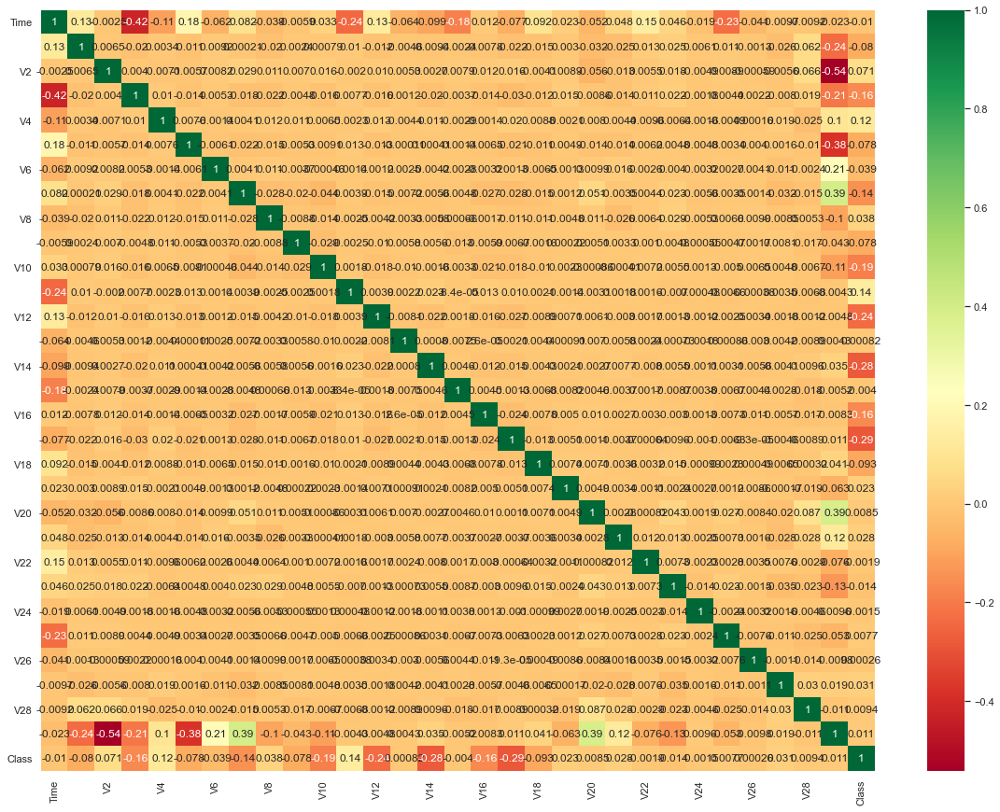

In [10]:
sns.heatmap(data[data.columns[:]].corr(),annot=True,cmap='RdYlGn')
fig=plt.gcf()
fig.set_size_inches(20,15)
plt.show()

In [11]:
#target vector y
#voor het netwerk een beetje gelijk terken
fraud = df[df['Class'] == 1]
normal = df[df['Class'] == 0].sample(n = 3000)

test_set = normal.append(fraud).sample(frac=1).reset_index(drop=True)

x_test = test_set.drop(['Class'], axis = 1).values
y_test = test_set['Class'].values

#netwerk
input_dim =x_test.shape[1]

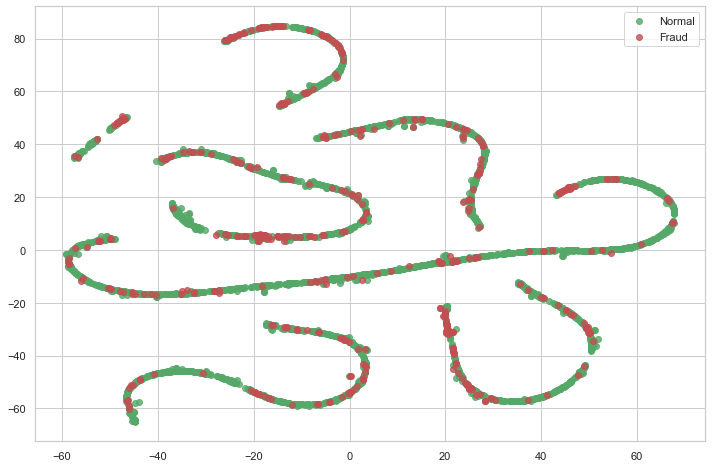

In [12]:
tsne = TSNE(n_components=2, random_state=0)

X_t = tsne.fit_transform(x_test)
plt.figure(figsize=(12, 8))
plt.scatter(X_t[np.where(y_test == 0), 0],
            X_t[np.where(y_test == 0), 1],
            marker='o',# rondje
            color='g',
            linewidth=1, alpha=0.8, label='Normal')
plt.scatter(X_t[np.where(y_test == 1), 0],
            X_t[np.where(y_test == 1), 1],
            marker='o',
            color='r',
            linewidth=1,
            alpha=0.8, label='Fraud')
plt.legend(loc='best')
plt.savefig("bevore_auto.png");
plt.show();

dit maar het niet veel makelijker frouden en normaal lijken dus best wel veel op mekaar


In [13]:
encoder_input = Input(input_dim, name = 'encoder_input')

## encoding part
encoded = Dense(64, activation='tanh',name = 'encoder_1',activity_regularizer=regularizers.l1(10e-5))(encoder_input)
encoded = Dense(32, activation='relu',name = 'encoder_2')(encoded)
#encoded = Dense(16, activation='relu',name = 'encoder_3')(encoded)

## decoding part
#decoded = Dense(16, activation='tanh',name = 'decpred_1')(encoded)
decoded = Dense(32, activation='tanh',name = 'decpred_2')(encoded)
Decoder = Dense(64, activation='tanh',name = 'decpred_3')(decoded)

## output layer
output_layer = Dense(input_dim, activation='relu')(Decoder)

AutoEncoderModel = Model(inputs=encoder_input, outputs=output_layer)

In [14]:
from sklearn import preprocessing

x_train = df.drop(['Class'], axis =1)
y_train =df['Class'].values
#
x_train = preprocessing.MinMaxScaler().fit_transform(x_train.values)
#nice data is nu wat meer dievers kijken of dat hij dit kan trainen
x_train

array([[0.00000000e+00, 9.35192337e-01, 7.66490419e-01, ...,
        4.18976135e-01, 3.12696634e-01, 5.82379309e-03],
       [0.00000000e+00, 9.78541955e-01, 7.70066651e-01, ...,
        4.16345145e-01, 3.13422663e-01, 1.04705276e-04],
       [5.78730497e-06, 9.35217023e-01, 7.53117667e-01, ...,
        4.15489266e-01, 3.11911316e-01, 1.47389219e-02],
       ...,
       [9.99976851e-01, 9.90904812e-01, 7.64079694e-01, ...,
        4.16593177e-01, 3.12584864e-01, 2.64215395e-03],
       [9.99976851e-01, 9.54208999e-01, 7.72855742e-01, ...,
        4.18519535e-01, 3.15245157e-01, 3.89238944e-04],
       [1.00000000e+00, 9.49231759e-01, 7.65256401e-01, ...,
        4.16466371e-01, 3.13400843e-01, 8.44648509e-03]])

In [15]:
x_norm, x_fraud = x_train[y_train == 0], x_train[y_train == 1]

In [16]:

AutoEncoderModel.compile(loss="mse", optimizer='adadelta')
AutoEncoderModel.summary()

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
encoder_input (InputLayer)   [(None, 30)]              0         
_________________________________________________________________
encoder_1 (Dense)            (None, 64)                1984      
_________________________________________________________________
encoder_2 (Dense)            (None, 32)                2080      
_________________________________________________________________
decpred_2 (Dense)            (None, 32)                1056      
_________________________________________________________________
decpred_3 (Dense)            (None, 64)                2112      
_________________________________________________________________
dense (Dense)                (None, 30)                1950      
Total params: 9,182
Trainable params: 9,182
Non-trainable params: 0
____________________________________________________

In [17]:
#we auto enkorer hoeft aleen maar een classe goed te kunnen zo dat we laten de anderne class makelijke kunnen her kennen \
#Ook door minmax scaler kunnen we minder dat gebruiken maar nogsteets een behorlijk evensient netwerk hebben
AutoEncoderModel.fit(x_norm[0:3000], x_norm[0:3000],
                batch_size = 256, epochs = 10,
                shuffle = True, validation_split = 0.20);


Epoch 1/10
10/10 [==============================] - 0s 19ms/step - loss: 0.2902 - val_loss: 0.2895
Epoch 2/10
10/10 [==============================] - 0s 2ms/step - loss: 0.2900 - val_loss: 0.2894
Epoch 3/10
10/10 [==============================] - 0s 3ms/step - loss: 0.2898 - val_loss: 0.2892
Epoch 4/10
10/10 [==============================] - 0s 2ms/step - loss: 0.2896 - val_loss: 0.2890
Epoch 5/10
10/10 [==============================] - 0s 3ms/step - loss: 0.2894 - val_loss: 0.2888
Epoch 6/10
10/10 [==============================] - 0s 2ms/step - loss: 0.2892 - val_loss: 0.2886
Epoch 7/10
10/10 [==============================] - 0s 3ms/step - loss: 0.2890 - val_loss: 0.2884
Epoch 8/10
10/10 [================

In [18]:
hidden_representation = Sequential()
hidden_representation.add(AutoEncoderModel.layers[0])
hidden_representation.add(AutoEncoderModel.layers[1])
hidden_representation.add(AutoEncoderModel.layers[2])

In [19]:
norm_hid_rep = hidden_representation.predict(x_norm[:3000])
fraud_hid_rep = hidden_representation.predict(x_fraud)

In [20]:
rep_x = np.append(norm_hid_rep, fraud_hid_rep, axis = 0)
y_n = np.zeros(norm_hid_rep.shape[0])
y_f = np.ones(fraud_hid_rep.shape[0])
rep_y = np.append(y_n, y_f)

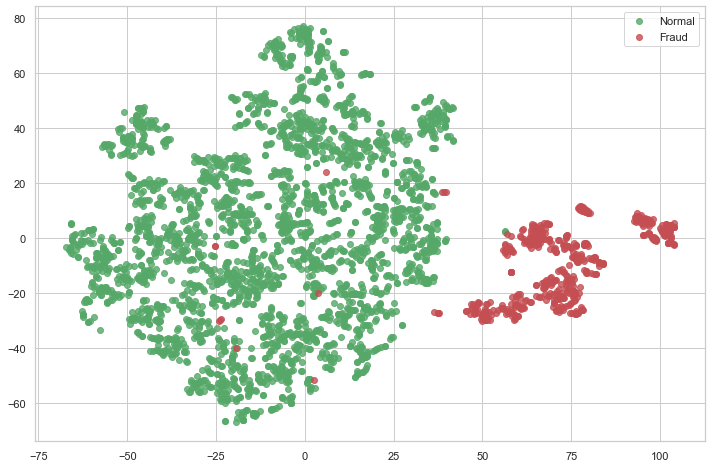

In [21]:
tsne = TSNE(n_components=2, random_state=0)

X_t = tsne.fit_transform(rep_x)
plt.figure(figsize=(12, 8))
plt.scatter(X_t[np.where(rep_y == 0), 0],
            X_t[np.where(rep_y == 0), 1],
            marker='o',# rondje
            color='g',
            linewidth=1, alpha=0.8, label='Normal')
plt.scatter(X_t[np.where(rep_y == 1), 0],
            X_t[np.where(rep_y == 1), 1],
            marker='o',
            color='r',
            linewidth=1,
            alpha=0.8, label='Fraud')
plt.legend(loc='best')
plt.savefig("auto_code.png");
plt.show();


Dit werk best goed zo als we kunnen zie is het niet perfect maakt hier een daar nog een fout je.
Maar voor zo simpel netwerk is het wel verbasent hoe goed het werkt

